In [1]:
%load_ext autoreload
%autoreload 2

# Base Notebook to re-create figures of _

This notebook is the base notebook for 10X's Xenium brain showcase tissue sample. It runs the standard ovrlpy pipeline and saves the results to be used in further analysis.

In [2]:
from pathlib import Path
import matplotlib

centimeter = 1/2.54 # conversion from inch, for plotting

font = {'family' : 'sans-serif',
        'weight' : 'normal',
        'size'   : 8}

matplotlib.rc('font', **font)

n_replicate = 2

data_folder_path = Path(f"/dh-projects/ag-ishaque/raw_data/tiesmeys-ovrlpy/Xenium-brain-2024/replicate{n_replicate}")


### Data loader:

In [3]:
import pandas as  pd

coordinate_df = pd.read_parquet(data_folder_path/"transcripts.parquet")
coordinate_df["feature_name"]=coordinate_df.feature_name.str.decode("utf-8")

# remove dummy molecules:
dummy_mask = (coordinate_df.feature_name.str.contains('BLANK') | coordinate_df.feature_name.str.contains('NegControl'))
coordinate_df = coordinate_df[~dummy_mask]

# format columns:
coordinate_df = coordinate_df[['x_location','y_location','z_location','feature_name','cell_id','overlaps_nucleus','qv']]
coordinate_df.columns = ['x','y','z','gene','cell_id','overlaps_nucleus','qv']
coordinate_df['gene'] = coordinate_df['gene'].astype("category")

print(f"Number of cells: {coordinate_df.cell_id.nunique()}",f"Number of genes: {coordinate_df.gene.nunique()}",f"Number of molecules: {coordinate_df.shape[0]}",sep="\n")

genes = coordinate_df.gene.cat.categories

Number of cells: 154655
Number of genes: 248
Number of molecules: 58403553


In [4]:
import numpy as np
import matplotlib.pyplot as plt

signatures_ = pd.read_csv('/dh-projects/ag-ishaque/raw_data/Xenium-benchmark/scRNAseq/trimmed_means.csv',index_col=0)

signatures_ = signatures_.T.groupby(lambda x: x.split('_')[1].split(' ')[0].split('-')[0]).apply(lambda x: x.mean(0)).T

signatures = pd.DataFrame(index=genes,columns=signatures_.columns)
signatures = signatures.fillna(0.0)

for gene in genes:
    if gene in signatures_.index:
        signatures.loc[gene] = signatures_.loc[gene]

del signatures_ 

signatures.columns=signatures.columns.str.replace('/','-')



/tmp/ipykernel_2568755/3420117031.py:9: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  signatures = signatures.fillna(0.0)


In [5]:
import anndata as ad

adata = ad.read_mtx(data_folder_path/"cell_feature_matrix/matrix.mtx").T
adata.var = pd.read_csv(data_folder_path/"cell_feature_matrix/features.tsv", header=None, index_col=1, names=["gene_id", "gene", "feature_type"],sep="\t")
obs_dict = pd.read_parquet(data_folder_path/"cells.parquet",)#.set_index("cell_id")
for c in obs_dict.columns:
    adata.obs[c] = obs_dict[c].values
adata.obs.set_index("cell_id",inplace=True)
adata.obs.index = adata.obs.index.astype("category")
adata.obs[['x_centroid','y_centroid']]

# Filter out empty cells:
# adata = adata[adata.X.sum(axis=1)>50]

,x_centroid,y_centroid
cell_id,,
1,1090.937543,3370.409167
2,1098.858667,3380.579285
3,1099.961841,3398.308508
4,1113.451959,3390.705200
5,1124.115662,3391.885986
...,...,...
154650,8318.217871,4336.909595
154651,8310.197656,4345.136499
154652,8328.073389,4344.464551


In [6]:
import os 
os.listdir(data_folder_path/"cell_feature_matrix")

['barcodes.tsv', 'features.tsv', 'matrix.mtx']

In [7]:
import ovrlpy

visualizer = ovrlpy.load_visualizer("./publication/xenium-brain/xenium-brain.vis")

signal_integrity = visualizer.integrity_map
signal_strength = visualizer.signal_map


In [8]:
from shapely.geometry import Polygon as shapely_Polygon
import tqdm
import rasterio
from rasterio.features import rasterize

um_per_pixel=1

cell_boundaries = pd.read_parquet(data_folder_path/"cell_boundaries.parquet")
nucleus_boundaries = pd.read_parquet(data_folder_path/"nucleus_boundaries.parquet")
cell_boundaries[['vertex_x','vertex_y']]/=um_per_pixel
nucleus_boundaries[['vertex_x','vertex_y']]/=um_per_pixel

max_size = [0,0]

polygons = []
for i, cell_id in tqdm.tqdm(enumerate(adata.obs.index),total = len(adata.obs)):
    coords = nucleus_boundaries[nucleus_boundaries.cell_id==cell_id][['vertex_x','vertex_y']] 
    # coords = cell_boundaries[cell_boundaries.cell_id==cell_id][['vertex_x','vertex_y']] 
    
    max_size[0] = max(max_size[0],coords['vertex_x'].max())
    max_size[1] = max(max_size[1],coords['vertex_y'].max())
    
    polygons.append((shapely_Polygon(coords.values),cell_id))
    
segmentation_map_ = rasterize(polygons, out_shape=signal_integrity.shape, fill=np.nan, all_touched=True, dtype=float, )

 ... (more hidden) ...


/tmp/ipykernel_2568755/983160985.py:17: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  adata.obs["above_threshold"] = signal_integrity_integration_groups.apply(lambda x: np.mean(x.signal_integrity_>0.3))


,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,total_counts,cell_area,nucleus_area,mean_integrity,min_integrity,median_integrity,quartile_integrity,above_threshold,area,integrity
cell_id,,,,,,,,,,,,,,,
1,1090.937543,3370.409167,628,0,0,628,441.763594,70.985625,0.698847,0.304967,0.736287,0.817903,1.000000,62.0,0.000000
2,1098.858667,3380.579285,189,0,0,189,236.167188,19.642969,0.705674,0.330194,0.772721,0.796490,1.000000,31.0,0.676742
3,1099.961841,3398.308508,536,0,0,537,371.229531,72.069375,0.586727,0.496132,0.610784,0.624326,1.000000,6.0,0.652536
4,1113.451959,3390.705200,300,0,0,300,272.292188,68.050469,0.508347,0.227643,0.590557,0.667411,0.750000,12.0,0.615816
5,1124.115662,3391.885986,189,0,0,189,127.024531,56.219531,0.715923,0.279841,0.763960,0.819831,0.971831,71.0,0.775034
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
154650,8318.217871,4336.909595,190,0,0,190,125.489219,39.060156,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
154651,8310.197656,4345.136499,432,0,0,432,187.308125,64.754063,0.635538,0.476073,0.639942,0.678646,1.000000,8.0,0.476073
154652,8328.073389,4344.464551,292,0,0,292,255.132812,24.023125,0.716295,0.478399,0.738248,0.780011,1.000000,9.0,0.612093


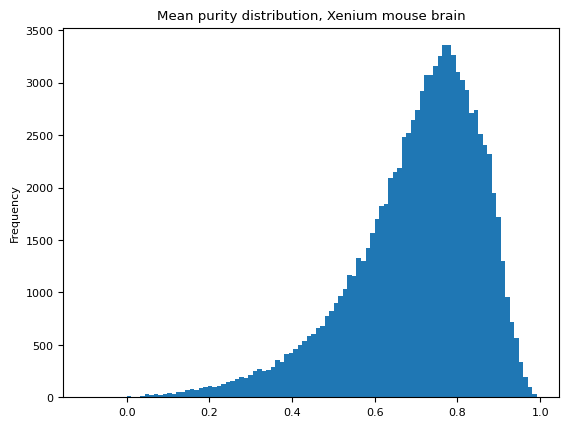

In [9]:

signal_integrity_ = signal_integrity.copy()
signal_integrity_[signal_strength<1]=np.nan

signal_integrity_integration_mask = (signal_strength>1.5) & (segmentation_map_>0)

signal_integrity_integration_df = pd.DataFrame(signal_integrity_[signal_integrity_integration_mask].flatten(),columns=['signal_integrity_'])
signal_integrity_integration_df['segmentation_map'] = segmentation_map_[signal_integrity_integration_mask].flatten()
# signal_integrity_integration_df['signal_strength'] = signal_strength[signal_integrity_integration_mask].flatten()

signal_integrity_integration_groups = signal_integrity_integration_df.groupby('segmentation_map')


adata.obs["mean_integrity"] = signal_integrity_integration_groups.mean().signal_integrity_
adata.obs["min_integrity"] = signal_integrity_integration_groups.min().signal_integrity_
adata.obs["median_integrity"] = signal_integrity_integration_groups.median().signal_integrity_
adata.obs["quartile_integrity"] = signal_integrity_integration_groups.quantile(0.75).signal_integrity_
adata.obs["above_threshold"] = signal_integrity_integration_groups.apply(lambda x: np.mean(x.signal_integrity_>0.3))
adata.obs["area"] = signal_integrity_integration_groups.size()
# adata.obs["mean_signal"] = signal_integrity_integration_groups.mean().signal_strength

adata.obs.mean_integrity.plot.hist(bins=100, title="Mean purity distribution, Xenium mouse brain")

adata.obs['integrity'] = signal_integrity[adata.obs.y_centroid.astype(int),adata.obs.x_centroid.astype(int)]

adata.obs

In [10]:
nuclear_filter = coordinate_df.overlaps_nucleus==1
nuclear_df = coordinate_df[nuclear_filter]

nucleus_coordinates = nuclear_df[['x','y','cell_id']].groupby('cell_id').mean()

adata.obs['nucleus_x'] = nucleus_coordinates.x
adata.obs['nucleus_y'] = nucleus_coordinates.y

adata.obs['nuclear_integrity'] = np.nan

adata.obs.loc[~adata.obs.nucleus_x.isna().values,'nuclear_integrity'] = signal_integrity[adata.obs.nucleus_y.dropna().astype(int),adata.obs.nucleus_x.dropna().astype(int)]


/tmp/ipykernel_2568755/269348723.py:6: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_marker_counts = gene_group_df.groupby("group").apply(lambda x: np.array(adata.X[:,x.idx].sum(1)).flatten())


<Axes: ylabel='Frequency'>

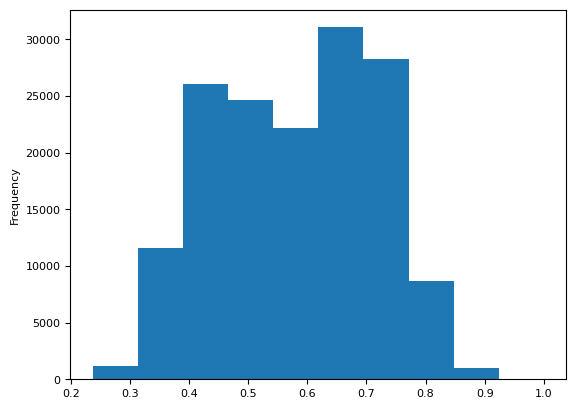

In [11]:
import numpy as np

gene_group_df = pd.read_csv("/dh-projects/ag-ishaque/raw_data/tiesmeys-ovrlpy/Xenium-brain-2024/replicate1/Xenium_V1_FF_Mouse_Brain_MultiSection_Input_gene_groups.csv",header=0,index_col=0,usecols=[0,1])
gene_group_df['idx']=np.arange(len(gene_group_df))

group_marker_counts = gene_group_df.groupby("group").apply(lambda x: np.array(adata.X[:,x.idx].sum(1)).flatten())
group_marker_counts = pd.DataFrame(group_marker_counts.values.tolist(),index=group_marker_counts.index,columns=adata.obs.index)

assignments_by_marker_counts = group_marker_counts.idxmax(axis=0)
marker_purities = np.array([group_marker_counts.at[idx, col] for idx, col in zip(assignments_by_marker_counts.values, assignments_by_marker_counts.index)])/group_marker_counts.sum(0)

marker_purities

adata.obs["assignments_by_marker_counts"] = assignments_by_marker_counts
adata.obs["marker_purities"] = marker_purities

adata.obs.marker_purities.plot.hist()

#### Create count matrices for use in mapmycells:

In [12]:
import tqdm

bottom_count_mtx = pd.DataFrame(index=coordinate_df.gene.cat.categories,columns=adata.obs.index,dtype=int).fillna(0)
top_count_mtx = pd.DataFrame(index=coordinate_df.gene.cat.categories,columns=adata.obs.index,dtype=int).fillna(0)

nuclear_df['z_delim'] = nuclear_df[['cell_id','z']].groupby('cell_id').transform("median")

bottom_counts = nuclear_df[(nuclear_df.z<nuclear_df.z_delim)&(nuclear_df.overlaps_nucleus==1)].groupby("gene").apply(lambda x:x.cell_id.value_counts())
top_counts = nuclear_df[(nuclear_df.z>nuclear_df.z_delim)&(nuclear_df.overlaps_nucleus==1)].groupby("gene").apply(lambda x:x.cell_id.value_counts())


for i,g in tqdm.tqdm(enumerate(nuclear_df.gene.cat.categories),total=len(nuclear_df.gene.cat.categories)):
    # print(bottom_counts.loc[c])
    bottom_count_mtx.loc[g] = bottom_counts[g]
    top_count_mtx.loc[g] = top_counts[g]
    
bottom_count_mtx.fillna(0,inplace=True)
top_count_mtx.fillna(0,inplace=True)
    
# sns.heatmap(top_count_mtx,cmap='viridis',vmax=10)

import anndata
anndata.AnnData(bottom_count_mtx.T).write_h5ad(f"../ovrlpy_24/publication/xenium-brain/top-bottom-qc/bottom_r{n_replicate}_count_mtx_nuclei.h5ad")
anndata.AnnData(top_count_mtx.T).write_h5ad(f"../ovrlpy_24/publication/xenium-brain/top-bottom-qc/top_r{n_replicate}_count_mtx_nuclei.h5ad")
anndata.AnnData(bottom_count_mtx.T+top_count_mtx.T).write_h5ad(f"../ovrlpy_24/publication/xenium-brain/top-bottom-qc/whole_r{n_replicate}_count_mtx_nuclei.h5ad")

/tmp/ipykernel_2568755/1980798381.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nuclear_df['z_delim'] = nuclear_df[['cell_id','z']].groupby('cell_id').transform("median")
/tmp/ipykernel_2568755/1980798381.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bottom_counts = nuclear_df[(nuclear_df.z<nuclear_df.z_delim)&(nuclear_df.overlaps_nucleus==1)].groupby("gene").apply(lambda x:x.cell_id.value_counts())
/tmp/ipykernel_2568755/1980798381.py:8: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and

### Create a publishable HD figure of the colorized tissue:

In [13]:
import os


def load_mapmycells_csv(region='whole'):
    files = os.listdir(f"publication/xenium-brain/top-bottom-qc/mapmycells/{region}/")
    csv = sorted([f for f in files if (f.endswith(".csv") and f"_r{n_replicate}_" in f)])[-1]
    
    mapmycells_df = pd.read_csv(f"publication/xenium-brain/top-bottom-qc/mapmycells/{region}/{csv}",index_col=0,skiprows=4)
    
    print(f"Loaded {csv}")
    
    return mapmycells_df

#### Upload mapmycells cell type assignments:

Loaded bottom_r2_count_mtx_nuclei_10xWholeMouseBrain(CCN20230722)_CorrelationMapping_UTC_1732540707747.csv
Loaded top_r2_count_mtx_nuclei_10xWholeMouseBrain(CCN20230722)_CorrelationMapping_UTC_1732543362738.csv


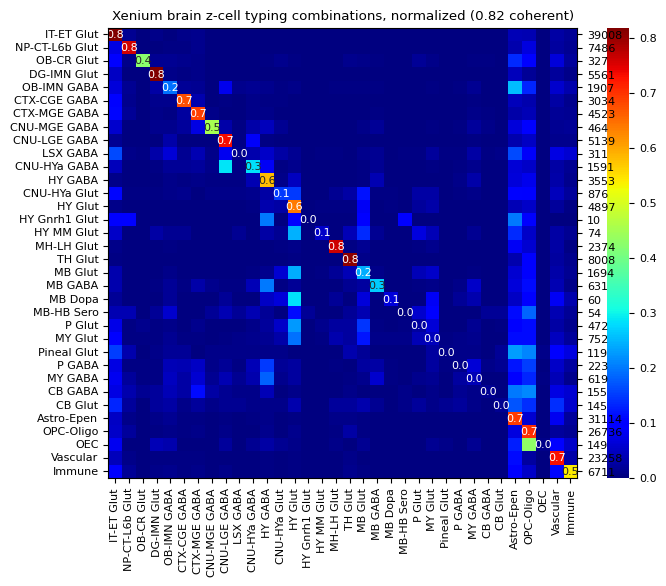

In [15]:
import seaborn as sns

# Correlation:
mapmycells_df_bottom = load_mapmycells_csv('bottom')
mapmycells_df_top = load_mapmycells_csv('top')

# ratio of coherently predicted cell types across the vertical demarcation:
global_prediction_coherence =(mapmycells_df_top.class_name.astype(str)==mapmycells_df_bottom.class_name.astype(str)).mean()

mapmycells_df_top['family_name'] = mapmycells_df_top.class_name.str.split(' ').str[-1].astype('category')
mapmycells_df_bottom['family_name'] = mapmycells_df_bottom.class_name.str.split(' ').str[-1].astype('category')
all_classes = sorted(list(set(mapmycells_df_top['class_name'].unique()).union(set(mapmycells_df_bottom['class_name'].unique()))))

(mapmycells_df_top == mapmycells_df_bottom).mean()

celltype_combinations = pd.DataFrame(index=all_classes,columns=all_classes).astype(float)
celltype_crosscombinations = celltype_combinations.copy()

counts = pd.Series(index=all_classes,dtype=int)
annotations = pd.DataFrame(index=all_classes,columns=all_classes).astype(str)
annotations[:] = ''

for i in celltype_combinations.index:
    for j in celltype_combinations.columns:
        celltype_combinations.loc[i,j] = ((mapmycells_df_top['class_name']==i)&(mapmycells_df_bottom['class_name']==j)).sum()
        if i==j:
            celltype_crosscombinations.loc[i,j]=np.nan
            continue
        celltype_crosscombinations.loc[i,j] = celltype_combinations.loc[i,j]
        
    counts[i] = ((mapmycells_df_top['class_name']==i)|(mapmycells_df_bottom['class_name']==i)).sum()


celltype_combinations = celltype_combinations+celltype_combinations.T
celltype_combinations /= np.eye(len(celltype_combinations))+1
celltype_combinations.index = celltype_combinations.index.str.split(' ').str[1:].str.join(' ')
celltype_combinations.columns = celltype_combinations.columns.str.split(' ').str[1:].str.join(' ')

celltype_combinations/=celltype_combinations.sum(1)
celltype_combinations = celltype_combinations.T


celltype_crosscombinations = celltype_crosscombinations+celltype_crosscombinations.T
celltype_crosscombinations.index = celltype_crosscombinations.index.str.split(' ').str[1:].str.join(' ')
celltype_crosscombinations.columns = celltype_crosscombinations.columns.str.split(' ').str[1:].str.join(' ')

celltype_crosscombinations/=celltype_crosscombinations.sum(1)
celltype_crosscombinations = celltype_crosscombinations.T

for i in range(len(celltype_combinations.index)):
    annotations.iloc[i,i] = f"{celltype_combinations.iloc[i,i]:.1f}"        
    
fig = plt.figure(figsize=(18*centimeter,15*centimeter))
ax = plt.subplot(111)
sns.heatmap(celltype_combinations,annot=annotations,ax=ax,cmap='jet',fmt='')
plt.title(f"Xenium brain z-cell typing combinations, normalized ({global_prediction_coherence:.2f} coherent)")

# Set the secondary y-axis ticks and labels
ax2 = ax.twinx()
ax2.set_yticks(ax.get_yticks())
ax2.set_yticklabels(counts.astype(int).astype(str))
ax2.set_ylim(ax.get_ylim())
plt.tight_layout()

plt.savefig(f"publication/xenium-brain/top-bottom-qc/celltype_combinations_r{n_replicate}.pdf",dpi=300)
plt.savefig(f"publication/xenium-brain/top-bottom-qc/celltype_combinations_r{n_replicate}.svg",dpi=300)


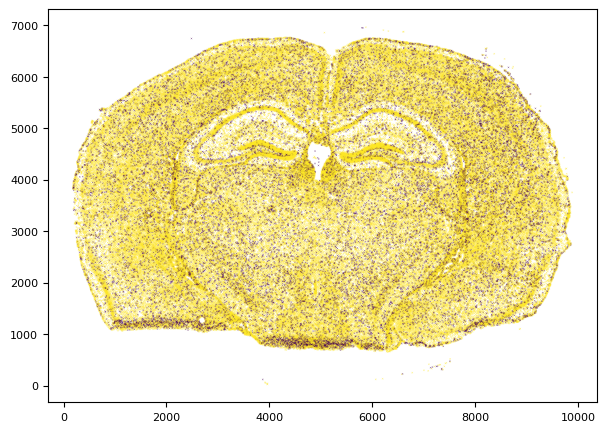

In [14]:
plt.figure(figsize=(18*centimeter,15*centimeter))


plt.scatter(adata.obs.x_centroid,adata.obs.y_centroid,c=mapmycells_df_top['family_name']==mapmycells_df_bottom['family_name'],cmap='viridis',marker='x',s=0.01,rasterized=True)

plt.gca().set_aspect('equal', adjustable='box')

plt.savefig("publication/xenium-brain/top-bottom-qc/doublet_map.pdf",dpi=600)
plt.savefig("publication/xenium-brain/top-bottom-qc/doublet_map.svg",dpi=600)

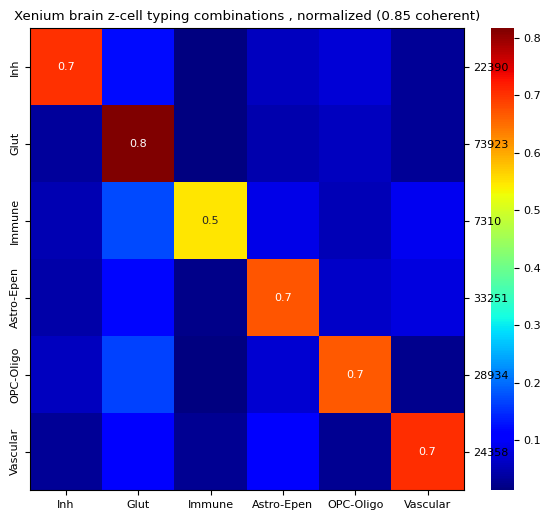

In [15]:

mapmycells_df_top['family_name'] = mapmycells_df_top.class_name.str.split(' ').str[-1]#.astype('category')
mapmycells_df_bottom['family_name'] = mapmycells_df_bottom.class_name.str.split(' ').str[-1]#.astype('category')
# all_classes = sorted(list(set(mapmycells_df_top['family_name'].unique()).union(set(mapmycells_df_bottom['family_name'].unique()))))
all_classes = 'Inh','Glut','Immune','Astro-Epen','OPC-Oligo','Vascular'
inh_classes = 'GABA','Sero'#,'Dopa'
mapmycells_df_bottom.loc[mapmycells_df_bottom['family_name'].isin(inh_classes),'family_name'] = 'Inh'
mapmycells_df_top.loc[mapmycells_df_top['family_name'].isin(inh_classes),'family_name'] = 'Inh'

global_prediction_coherence =(mapmycells_df_top.family_name.astype(str)==mapmycells_df_bottom.family_name.astype(str))[adata.obs.total_counts>100].mean()

(mapmycells_df_top == mapmycells_df_bottom).mean()

celltype_combinations = pd.DataFrame(index=all_classes,columns=all_classes).astype(float)
celltype_crosscombinations = celltype_combinations.copy()

counts = pd.Series(index=all_classes,dtype=int)
annotations = pd.DataFrame(index=all_classes,columns=all_classes).astype(str)
annotations[:] = ''

for i in celltype_combinations.index:
    for j in celltype_combinations.columns:
        celltype_combinations.loc[i,j] = (((mapmycells_df_top['family_name']==i)&(mapmycells_df_bottom['family_name']==j))[adata.obs.total_counts>100]).sum()
        if i==j:
            celltype_crosscombinations.loc[i,j]=np.nan
            continue
        celltype_crosscombinations.loc[i,j] = celltype_combinations.loc[i,j]
        
    counts[i] = ((mapmycells_df_top['family_name']==i)|(mapmycells_df_bottom['family_name']==i)).sum()

celltype_combinations = celltype_combinations+celltype_combinations.T
celltype_combinations /= np.eye(len(celltype_combinations))+1
# celltype_combinations.index = celltype_combinations.index.str.split(' ').str[1:].str.join(' ')
# celltype_combinations.columns = celltype_combinations.columns.str.split(' ').str[1:].str.join(' ')

celltype_combinations/=celltype_combinations.sum(1)
celltype_combinations = celltype_combinations.T

celltype_crosscombinations = celltype_crosscombinations+celltype_crosscombinations.T
celltype_crosscombinations.index = celltype_crosscombinations.index.str.split(' ').str[1:].str.join(' ')
celltype_crosscombinations.columns = celltype_crosscombinations.columns.str.split(' ').str[1:].str.join(' ')

celltype_crosscombinations/=celltype_crosscombinations.sum(1)
celltype_crosscombinations = celltype_crosscombinations.T

for i in range(len(celltype_combinations.index)):
    annotations.iloc[i,i] = f"{celltype_combinations.iloc[i,i]:.1f}"        
    
fig = plt.figure(figsize=(7,6))
ax = plt.subplot(111)
sns.heatmap(celltype_combinations,annot=annotations,ax=ax,cmap='jet',fmt='')
plt.title(f"Xenium brain z-cell typing combinations , normalized ({global_prediction_coherence:.2f} coherent)")

# Set the secondary y-axis ticks and labels
ax2 = ax.twinx()
ax2.set_yticks(ax.get_yticks())
ax2.set_yticklabels(counts.astype(int).astype(str))
ax2.set_ylim(ax.get_ylim())

plt.savefig("publication/xenium-brain/top-bottom-qc/celltype_combinations_family.pdf",dpi=300)
plt.savefig("publication/xenium-brain/top-bottom-qc/celltype_combinations_family.svg",dpi=300)



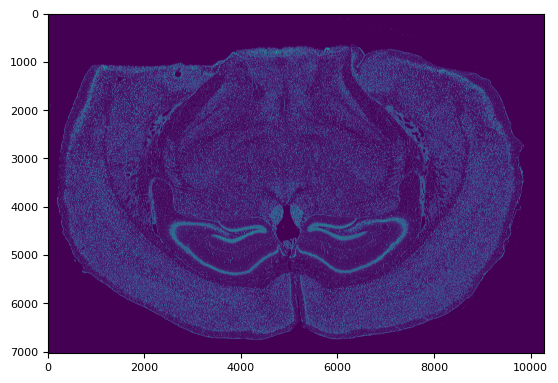

In [16]:
signal_strength = ovrlpy._ssam2.kde_2d(coordinate_df[['x','y',]].values,bandwidth=1).T

plt.imshow(signal_strength)

/dh-projects/ag-ishaque/analysis/tiesmeys/src/ovrlpy_24/conda-ovrlpy/lib/python3.12/site-packages/pandas/plotting/_matplotlib/core.py:1351: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatter = ax.scatter(
/dh-projects/ag-ishaque/analysis/tiesmeys/src/ovrlpy_24/conda-ovrlpy/lib/python3.12/site-packages/pandas/plotting/_matplotlib/core.py:1351: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatter = ax.scatter(
/dh-projects

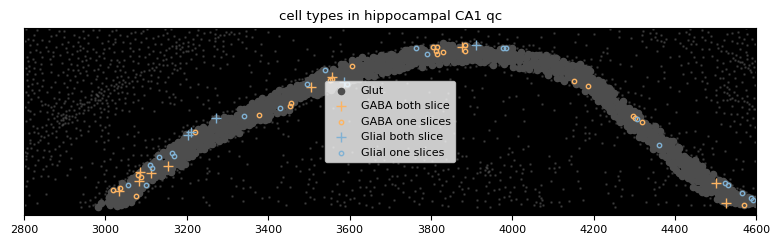

In [17]:
import matplotlib
from scipy.ndimage import gaussian_filter

class_color_dict = {
'Dopa': (0.9882352941176471, 0.803921568627451, 0.8980392156862745),
'Glut': (0.984313725490196, 0.5019607843137255, 0.4470588235294118),
'Inh': (0.9921568627450981, 0.7058823529411765, 0.3843137254901961),
'Astro-Epen': (0.7019607843137254, 0.8705882352941177, 0.4117647058823529),
'Vascular': (0.5529411764705883, 0.8274509803921568, 0.7803921568627451),
'OPC-Oligo': (0.5019607843137255, 0.6941176470588235, 0.8274509803921568),
'Immune': (1.0, 1.0, 0.7019607843137254),
'OEC': (0.7450980392156863, 0.7294117647058823, 0.8549019607843137),
}

c_glial = class_color_dict['OPC-Oligo']
c_Inh = class_color_dict['Inh']

plt.figure(figsize=(24*centimeter,12*centimeter),)
glial_classes = ['30 Astro-Epen', '33 Vascular', '31 OPC-Oligo', '34 Immune']


dense_map = gaussian_filter((gaussian_filter(signal_strength,10)>3).astype(float),13)>0.3
is_dense = (dense_map)[adata.obs.y_centroid.astype(int),adata.obs.x_centroid.astype(int)]
is_ca1 = is_dense&adata.obs.x_centroid.between(1400*2,3600*2)&adata.obs.y_centroid.between(2510*2,2730*2)
in_view = adata.obs.x_centroid.between(1400*2,3600*2)&adata.obs.y_centroid.between(2510*2,2730*2)

ax = plt.subplot(111,facecolor='k')

adata.obs[in_view].plot.scatter(x='x_centroid',y='y_centroid',c='darkgrey',s=1,alpha=0.2,ax=ax,rasterized=True)
adata.obs[is_ca1].plot.scatter(x='x_centroid',y='y_centroid',c=(0.3,0.3,0.3,),s=20,alpha=1.0,ax=ax,label="Glut",rasterized=True)
h_1 = adata.obs[is_ca1&((mapmycells_df_top.class_name.str.contains('GABA'))&(mapmycells_df_bottom.class_name.str.contains('GABA')))].plot.scatter(x='x_centroid',y='y_centroid',marker='+',c=c_Inh,edgecolors=c_Inh,linewidth=1,s=50,ax=ax,label='GABA both slice')
h_2 = adata.obs[is_ca1&((mapmycells_df_top.class_name.str.contains('GABA'))^(mapmycells_df_bottom.class_name.str.contains('GABA')))].plot.scatter(x='x_centroid',y='y_centroid',c=(0,0,0,0),edgecolors=c_Inh,linewidth=1,s=10,ax=ax,label='GABA one slices')

h_3 = adata.obs[is_ca1&((mapmycells_df_top.class_name.isin(glial_classes)))&((mapmycells_df_bottom.class_name.isin(glial_classes)))].plot.scatter(x='x_centroid',y='y_centroid',marker='+',c=c_glial,edgecolors=c_glial,linewidth=1,s=50,ax=ax,label='Glial both slice')
h_4 = adata.obs[is_ca1&((mapmycells_df_top.class_name.isin(glial_classes))^(mapmycells_df_bottom.class_name.isin(glial_classes)))].plot.scatter(x='x_centroid',y='y_centroid',c=(0,0,0,0),edgecolors=c_glial,linewidth=1,s=10,ax=ax,label='Glial one slices')

#.plot.scatter(x='x_centroid',y='y_centroid',c='goldenrod',s=20,alpha=0.5,ax=ax)

ca1_inh = adata.obs[is_ca1&((mapmycells_df_top.class_name.str.contains('GABA'))|(mapmycells_df_bottom.class_name.str.contains('GABA')))]
 
# plt.xlim(1400*2,3600*2)
plt.xlim(1400*2,4600)
plt.ylim(2500*2,2730*2)

plt.gca().set_aspect('equal', )
plt.title('cell types in hippocampal CA1 qc')

# plt.xticks([])
plt.yticks([])
plt.xlabel('')
plt.ylabel('')  

plt.legend()#[h_1,h_2,h_3,h_4],['GABA both slices','GABA one slice','Glial both slices','Glial one slice'],)

plt.savefig("publication/xenium-brain/top-bottom-qc/ca1_cell_scatter.pdf",dpi=600)
plt.savefig("publication/xenium-brain/top-bottom-qc/ca1_cell_scatter.svg",dpi=600)

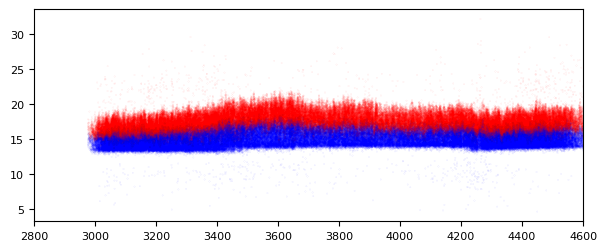

In [18]:
ovrlpy.pre_process_coordinates(coordinate_df)

plt.figure(figsize=(18*centimeter,7*centimeter),)

is_dense_molecule = (dense_map)[coordinate_df.y.astype(int),coordinate_df.x.astype(int)]
is_ca1_molecule = is_dense_molecule&coordinate_df.x.between(1400*2,3600*2)&coordinate_df.y.between(2510*2,2730*2)

ca1_coordinates = coordinate_df[is_ca1_molecule]

ax = plt.subplot(111)

plt.scatter(ca1_coordinates.x,ca1_coordinates.z,s=0.001,alpha=0.8,c=ca1_coordinates.z>ca1_coordinates.z_delim,cmap='bwr',rasterized=True)

plt.xlim(1400*2,4600)

plt.savefig("publication/xenium-brain/top-bottom-qc/ca1_top_bottom_scatter.pdf",dpi=600)
plt.savefig("publication/xenium-brain/top-bottom-qc/ca1_top_bottom_scatter.svg",dpi=600) 

0.21 non-glut coherent


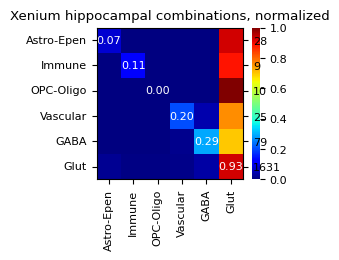

In [19]:


ca1_df_top = mapmycells_df_top[is_ca1].copy()
ca1_df_bottom = mapmycells_df_bottom[is_ca1].copy()

ca1_df_top['family_name'] = ca1_df_top.class_name.str.split(' ').str[-1].astype('str')
ca1_df_bottom['family_name'] = ca1_df_bottom.class_name.str.split(' ').str[-1].astype('str')

all_classes = sorted(list(set(ca1_df_top['family_name'].unique()).union(set(ca1_df_bottom['family_name'].unique()))))


global_prediction_coherence =(ca1_df_top.family_name.astype(str)==ca1_df_bottom.family_name.astype(str))[~((ca1_df_top.family_name=='Glut')&(ca1_df_bottom.family_name=='Glut'))].mean()

celltype_combinations = pd.DataFrame(index=all_classes,columns=all_classes).astype(float)
celltype_crosscombinations = celltype_combinations.copy()

counts = pd.Series(index=all_classes,dtype=int)
annotations = pd.DataFrame(index=all_classes,columns=all_classes).astype(str)
annotations[:] = ''

for i in celltype_combinations.index:
    for j in celltype_combinations.columns:
        celltype_combinations.loc[i,j] = ((ca1_df_top['family_name']==i)&(ca1_df_bottom['family_name']==j)).sum()
        if i==j:
            celltype_crosscombinations.loc[i,j]=np.nan
            continue
        celltype_crosscombinations.loc[i,j] = celltype_combinations.loc[i,j]
        
    counts[i] = ((ca1_df_top['family_name']==i)|(ca1_df_bottom['family_name']==i)).sum()

celltype_combinations = celltype_combinations+celltype_combinations.T
celltype_combinations /= np.eye(len(celltype_combinations))+1

celltype_combinations[:] = celltype_combinations/celltype_combinations.sum(1)
celltype_combinations = celltype_combinations.T


celltype_crosscombinations = celltype_crosscombinations+celltype_crosscombinations.T
celltype_crosscombinations.index = celltype_crosscombinations.index.str.split(' ').str[1:].str.join(' ')
celltype_crosscombinations.columns = celltype_crosscombinations.columns.str.split(' ').str[1:].str.join(' ')

celltype_crosscombinations/=celltype_crosscombinations.sum(1)
celltype_crosscombinations = celltype_crosscombinations.T

axis_ticks = ["Astro-Epen","Immune","OPC-Oligo", "Vascular","GABA","Glut"]

for i in range(len(celltype_combinations.index)):
    annotations.iloc[i,i] = f"{celltype_combinations.iloc[i,i]:.2f}"        

    
fig = plt.figure(figsize=(6*centimeter,5*centimeter))
ax = plt.subplot(111)
sns.heatmap(celltype_combinations.loc[axis_ticks,axis_ticks],annot=annotations.loc[axis_ticks,axis_ticks],ax=ax,cmap='jet',fmt='')
plt.yticks(rotation=0)
plt.xticks(rotation=90)
plt.title(f"Xenium hippocampal combinations, normalized")

# Set the secondary y-axis ticks and labels
ax2 = ax.twinx()
ax2.set_yticks(ax.get_yticks())
ax2.set_yticklabels(counts[axis_ticks].astype(int).astype(str))
ax2.set_ylim(ax.get_ylim())

plt.savefig("publication/xenium-brain/top-bottom-qc/ca1_inh_combinations.pdf",dpi=300)
plt.savefig("publication/xenium-brain/top-bottom-qc/ca1_inh_combinations.svg",dpi=300)

print(f"{global_prediction_coherence:.2f} non-glut coherent")

#### A quantification of ovrlpy, using the signal integrity map:

In [20]:
# perform statistics between coherent and incoherent samples:
from scipy.stats import ttest_ind

print("Mean integrity values:")

gaba_coherent_integrity_samples = adata.obs[is_ca1&((mapmycells_df_top.class_name.str.contains('GABA'))&(mapmycells_df_bottom.class_name.str.contains('GABA')))].nuclear_integrity
gaba_incoherent_integrity_samples = adata.obs[is_ca1&((mapmycells_df_top.class_name.str.contains('GABA'))^(mapmycells_df_bottom.class_name.str.contains('GABA')))].nuclear_integrity
ttest_gaba = ttest_ind(gaba_coherent_integrity_samples,gaba_incoherent_integrity_samples,equal_var=False)

print(f"GABA coherent: {gaba_coherent_integrity_samples.mean()}")
print(f"GABA incoherent: {gaba_incoherent_integrity_samples.mean()}")
print(f"GABA t-test: {ttest_gaba}")
print()

glial_coherent_integrity_samples = adata.obs[is_ca1&((mapmycells_df_top.class_name.isin(glial_classes))&(mapmycells_df_bottom.class_name.isin(glial_classes)))]
glial_incoherent_integrity_samples = adata.obs[is_ca1&((mapmycells_df_top.class_name.isin(glial_classes))^(mapmycells_df_bottom.class_name.isin(glial_classes)))]
ttest_glial = ttest_ind(glial_coherent_integrity_samples.nuclear_integrity,glial_incoherent_integrity_samples.nuclear_integrity,equal_var=False)

print(f"Glial coherent: {glial_coherent_integrity_samples.nuclear_integrity.mean()}")
print(f"Glial incoherent: {glial_incoherent_integrity_samples.nuclear_integrity.mean()}")
print(f"Glial t-test: {ttest_glial}")


Mean integrity values:


GABA coherent: 0.8137223992717636
GABA incoherent: 0.5290403504017284
GABA t-test: TtestResult(statistic=np.float64(7.537843664196878), pvalue=np.float64(4.919579435721236e-10), df=np.float64(55.077889952792155))

Glial coherent: 0.7426346986119226
Glial incoherent: 0.5385273938333575
Glial t-test: TtestResult(statistic=np.float64(3.2496875580905056), pvalue=np.float64(0.008734430300726775), df=np.float64(9.991639283404643))


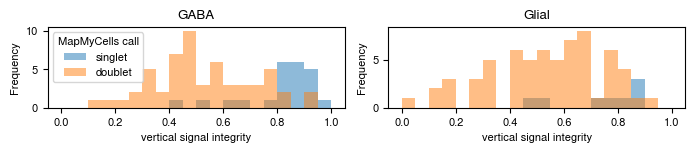

In [21]:


font = {'family' : 'Nimbus Sans',
        'weight' : 'normal',
        'size'   : 8}

matplotlib.rc('font', **font)


fig = plt.figure(figsize=(18*centimeter,4*centimeter))

plt.subplot(121)

gaba_coherent_integrity_samples.plot.hist(bins=20,range=(0,1),alpha=0.5,label='singlet')
gaba_incoherent_integrity_samples.plot.hist(bins=20,range=(0,1),alpha=0.5,label='doublet')

plt.ylabel('Frequency',)
plt.xlabel('vertical signal integrity',)
plt.legend(title='MapMyCells call')
plt.title('GABA',)



plt.subplot(122)

glial_coherent_integrity_samples.nuclear_integrity.plot.hist(bins=20,range=(0,1),alpha=0.5,label='singlet')
glial_incoherent_integrity_samples.nuclear_integrity.plot.hist(bins=20,range=(0,1),alpha=0.5,label='doublet')

plt.ylabel('Frequency',)
plt.xlabel('vertical signal integrity',)
# plt.legend(title='MapMyCells call')
plt.title('Glial',)

plt.tight_layout()

plt.savefig("publication/xenium-brain/top-bottom-qc/ca1_integrity_histograms.svg",dpi=600)

KeyboardInterrupt: 

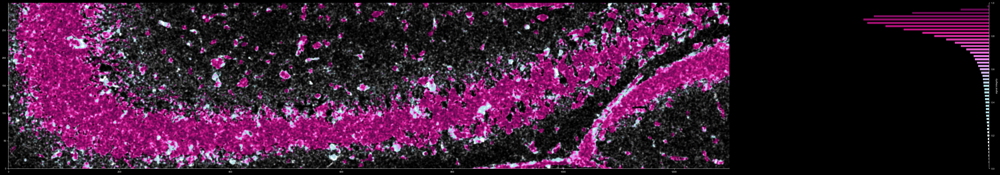

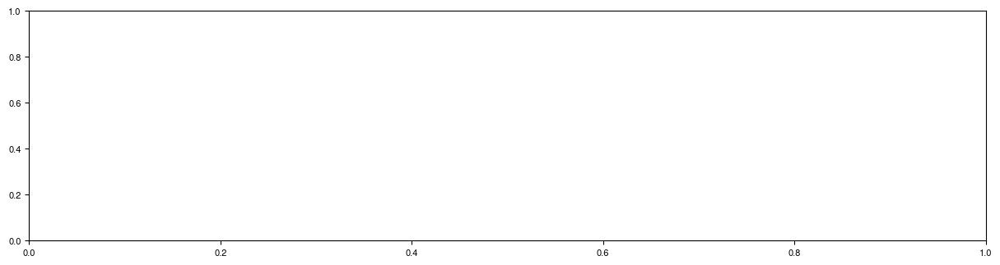

In [22]:
# window_size=20

is_activatory = lambda coords: ((coords-np.array((15,10)))**2).sum(1)>180



x_,_x = 2500,3800
y_,_y = 4300,4600


ovrlpy.plot_signal_integrity(signal_integrity[y_:_y,x_:_x],signal_strength[y_:_y,x_:_x])

fig = plt.figure(figsize=(15,8))

ax = plt.subplot(211)
subsample = coordinate_df[(coordinate_df.x.between(x_,_x))&(coordinate_df.y.between(y_,_y))]
subsample_embedding,subsample_rgb = visualizer.transform_transcripts(subsample)
subsample_activatory = is_activatory(subsample_embedding)

subsample[subsample.z<subsample.z_delim].plot.scatter(x='x',y='y',c=subsample_activatory[subsample.z<subsample.z_delim],s=0.1,rasterized=True,ax=ax,cmap='Reds_r')
ax.set_aspect('equal')

ax = plt.subplot(212)

subsample[subsample.z>subsample.z_delim].plot.scatter(x='x',y='y',c=subsample_activatory[subsample.z>subsample.z_delim],s=0.1,rasterized=True,ax=ax,cmap='Reds_r')

ax.set_aspect('equal')


    
 

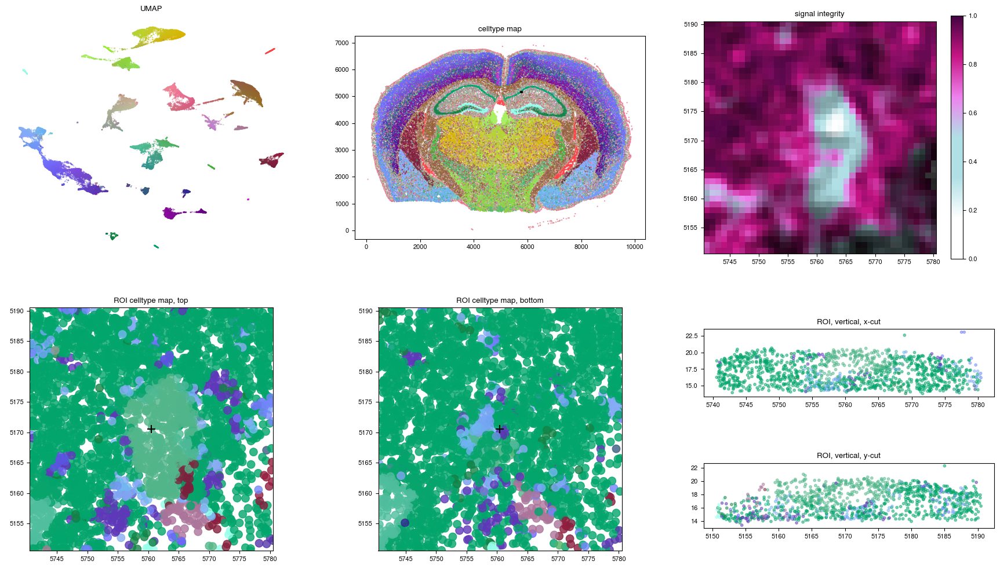

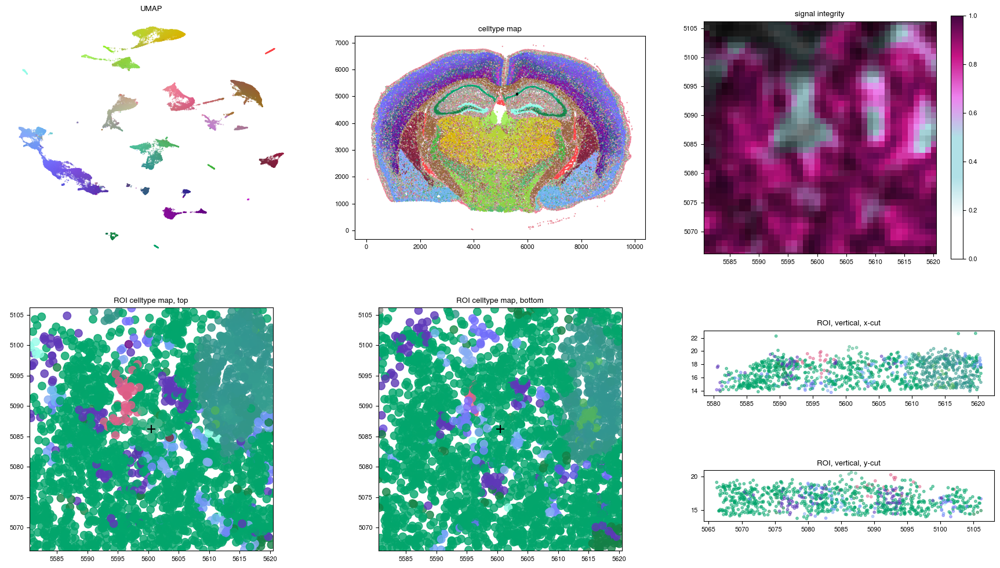

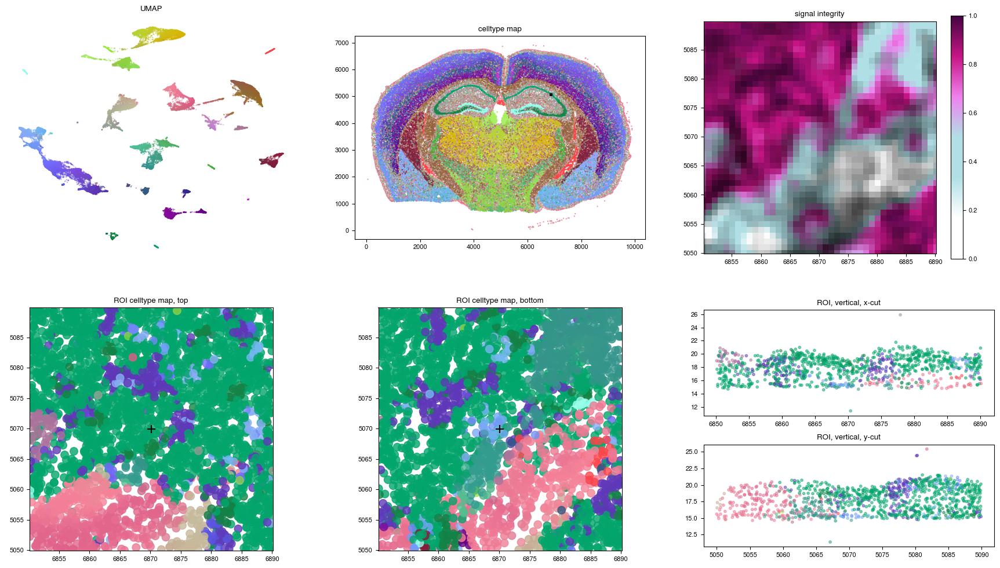

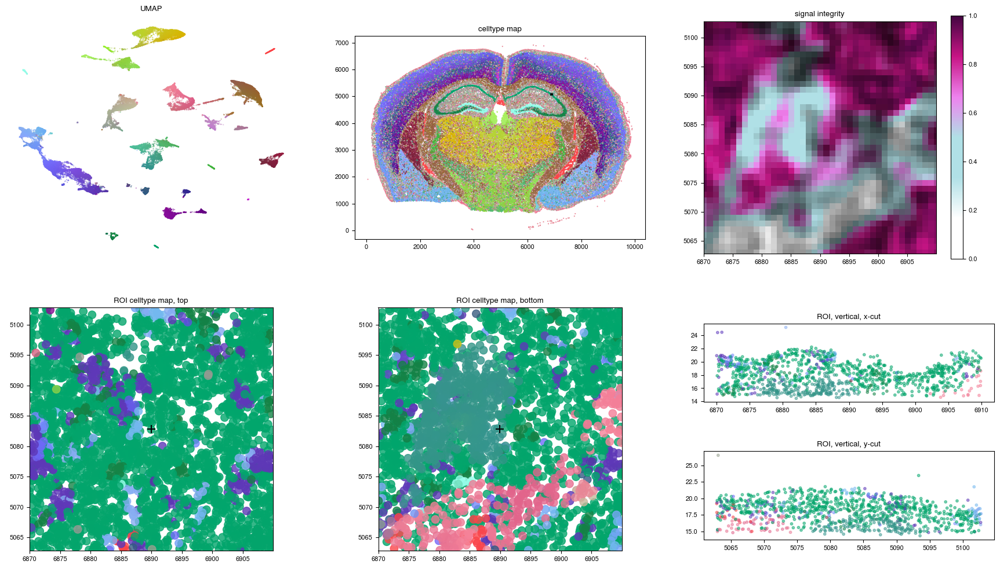

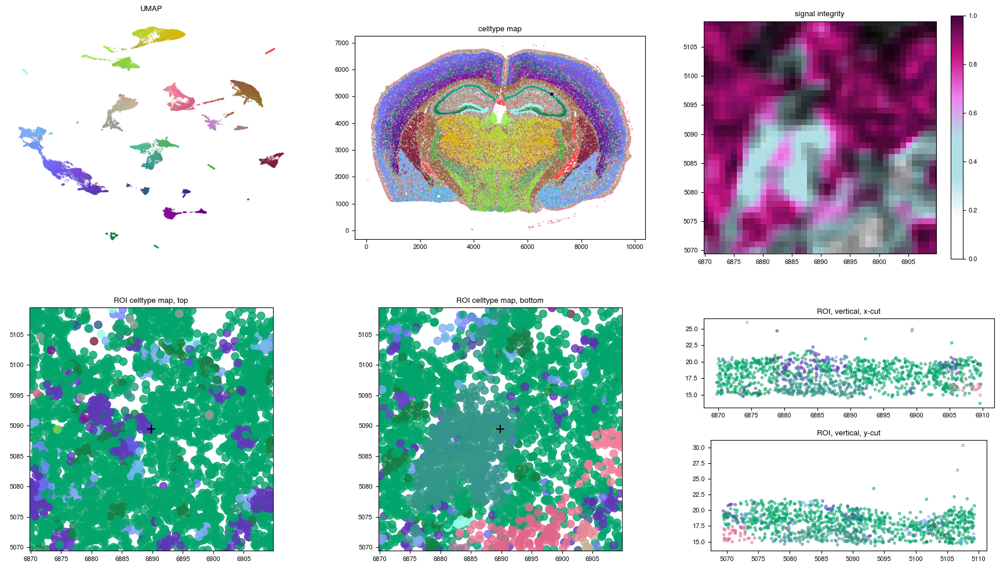

In [23]:
window_size=20

for i in range(5):
    cell_id = gaba_incoherent_integrity_samples.index[i]
    
    x,y = adata.obs.loc[cell_id,['x_centroid','y_centroid']]

    ovrlpy.plot_region_of_interest(
        x,
        y,
        coordinate_df,
        visualizer,
        signal_integrity,
        signal_strength,
        window_size=window_size,
    )    
    

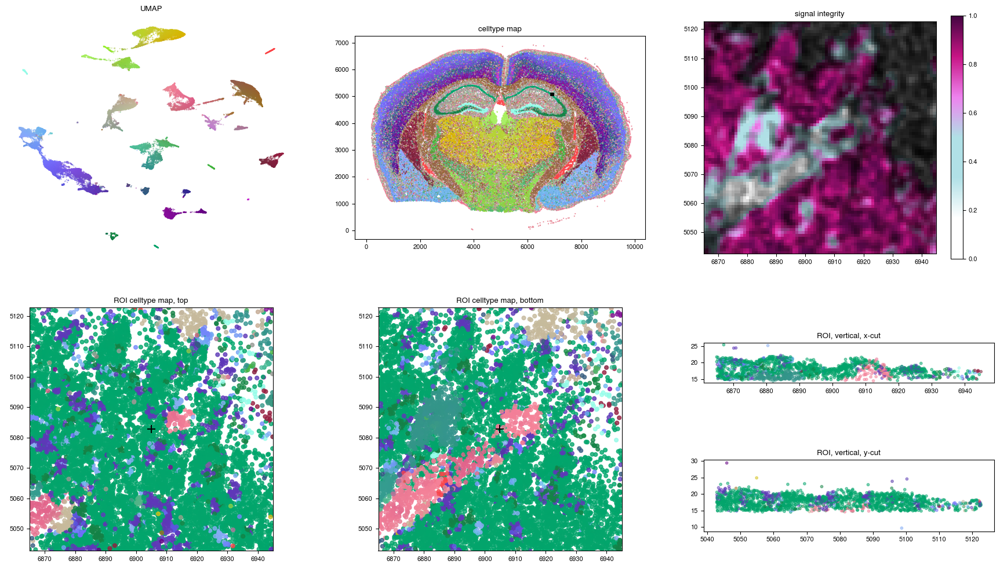

In [24]:
window_size = 40

for i in range(4,5):
    x,y = adata.obs[is_ca1&((mapmycells_df_top.class_name.isin(glial_classes))^(mapmycells_df_bottom.class_name.isin(glial_classes)))].iloc[i][['x_centroid','y_centroid']]
    
    ovrlpy.plot_region_of_interest(
        x,
        y,
        coordinate_df,
        visualizer,
        signal_integrity,
        signal_strength,
        window_size=window_size,
    )
    
    plt.savefig(f"publication/xenium-brain/top-bottom-qc/ca1_glial_{i}.pdf",dpi=300)
    plt.savefig(f"publication/xenium-brain/top-bottom-qc/ca1_glial_{i}.svg",dpi=300)

#### Print cell segments from top-bottom-missmatches with outlines:

In [ ]:
from matplotlib.cm import Set3

cell_boundaries = pd.read_parquet(data_folder_path/"cell_boundaries.parquet")
nucleus_boundaries = pd.read_parquet(data_folder_path/"nucleus_boundaries.parquet")

In [ ]:
gene_group_df.group.value_counts()

{c:color for c,color in zip(mapmycells_df_top.family_name.unique(),Set3.colors)}

class_color_dict = {
 'Dopa': (0.9882352941176471, 0.803921568627451, 0.8980392156862745),
 'Glut': (0.984313725490196, 0.5019607843137255, 0.4470588235294118),
 'Inh': (0.9921568627450981, 0.7058823529411765, 0.3843137254901961),
 'Astro-Epen': (0.7019607843137254, 0.8705882352941177, 0.4117647058823529),
 'Vascular': (0.5529411764705883, 0.8274509803921568, 0.7803921568627451),
 'OPC-Oligo': (0.5019607843137255, 0.6941176470588235, 0.8274509803921568),
 'Immune': (1.0, 1.0, 0.7019607843137254),
 'OEC': (0.7450980392156863, 0.7294117647058823, 0.8549019607843137),}

marker_color_dict = {'Neurons': (0.984313725490196, 0.5019607843137255, 0.4470588235294118),
                     'Endothelial': (0.5529411764705883, 0.8274509803921568, 0.7803921568627451),
                     'Astrocytes': (0.7019607843137254, 0.8705882352941177, 0.4117647058823529),
                        'Oligodendrocytes': (0.5019607843137255, 0.6941176470588235, 0.8274509803921568),
                        'Microglia': (1.0, 1.0, 0.7019607843137254),}

fig,axes = plt.subplots(1,2,figsize=(18*centimeter,9*centimeter))

axes[0].legend([plt.scatter([],[],c=color,label=label) for label,color in class_color_dict.items()],class_color_dict.keys(),loc='center',title='Cell types')
axes[1].legend([plt.scatter([],[],c=color,label=label) for label,color in marker_color_dict.items()],marker_color_dict.keys(),loc='center',title='Marker genes')


In [ ]:
from shapely.geometry import Polygon as shapely_Polygon

# coordinate_df['marker_celltype'] = coordinate_df.gene.map(gene_group_df.group).astype('category')

mismatch_ids = mapmycells_df_top[(mapmycells_df_top.family_name != mapmycells_df_bottom.family_name)].index

# adata.obs.loc[mismatch_ids].plot.scatter('x_centroid','y_centroid',c='r',s=0.01)


def plot_cells_in_window(x,y,window_size,plot_markers=True):
    
    in_window_cell_boundaries = cell_boundaries[(cell_boundaries.vertex_x.between(x-window_size,x+window_size))&(cell_boundaries.vertex_y.between(y-window_size,y+window_size))]
    in_window_nucleus_boundaries = nucleus_boundaries[(nucleus_boundaries.vertex_x.between(x-window_size,x+window_size))&(nucleus_boundaries.vertex_y.between(y-window_size,y+window_size))]

    in_window_ids = in_window_cell_boundaries.cell_id.unique()

    in_window_top_df = mapmycells_df_top.loc[in_window_ids]
    in_window_bottom_df = mapmycells_df_bottom.loc[in_window_ids]

    polygons_cell = {}
    polygons_nucleus = {}

    for i, cell_id in enumerate(in_window_ids):
        
        subset_cell_boundaries = cell_boundaries[cell_boundaries.cell_id==cell_id]
        subset_nucleus_boundaries = nucleus_boundaries[nucleus_boundaries.cell_id==cell_id]
        
        polygons_cell[cell_id] = shapely_Polygon(subset_cell_boundaries[['vertex_x','vertex_y']].values)
        polygons_nucleus[cell_id] = shapely_Polygon(subset_nucleus_boundaries[['vertex_x','vertex_y']].values)
  
    fig1,ax = plt.subplots(1,2,figsize=(12,6))

    for i, cell_id in enumerate(in_window_ids):
        color = Set3.colors[i%len(Set3.colors)]
        # if polygons_cell[cell_id] is None:
        #     continue
        x_verteces,y_verteces = polygons_cell[cell_id].exterior.xy
        ax[0].plot(x_verteces,y_verteces,'-',color='white',linewidth=1,alpha=0.8)
        ax[1].plot(x_verteces,y_verteces,'-',color='white',linewidth=1,alpha=0.8)
        
        # if polygons_nucleus[cell_id] is None:
        #     continue
        x_verteces,y_verteces = polygons_nucleus[cell_id].exterior.xy
        ax[0].fill(x_verteces,y_verteces,color=class_color_dict[in_window_top_df.loc[cell_id].family_name],alpha=1,linewidth=3)
        ax[1].fill(x_verteces,y_verteces,color=class_color_dict[in_window_bottom_df.loc[cell_id].family_name],alpha=1,linewidth=3)
        
        ax[0].set_xlim(int(x-window_size),int(x+window_size)+1)
        ax[0].set_ylim(int(y-window_size),int(y+window_size)+1)
        
        ax[1].set_xlim(int(x-window_size),int(x+window_size)+1)
        ax[1].set_ylim(int(y-window_size),int(y+window_size)+1)
        
    plt.legend([plt.scatter([],[],c=color,label=class_name) for class_name,color in class_color_dict.items()],class_color_dict.keys(),loc='upper left')
    
    ax[0].set_facecolor('black')
    ax[1].set_facecolor('black')
    
    ax[0].set_aspect('equal')
    ax[1].set_aspect('equal')
    
    if not plot_markers:
        return fig1
        
    subset_df = coordinate_df[(coordinate_df.x.between(x-window_size,x+window_size))&(coordinate_df.y.between(y-window_size,y+window_size))]
    
    fig2,ax = plt.subplots(1,2,figsize=(12,6))
    
    subset_df.plot.scatter('x','y',c='k',s=0.1,ax=ax[0],rasterized=True)
    subset_df.plot.scatter('x','y',c='k',s=0.1,ax=ax[1],rasterized=True)
    
    for i, marker_type in enumerate(marker_color_dict.keys()):
        subset_marker_df = subset_df[subset_df.gene.isin(gene_group_df[gene_group_df.group==marker_type].index)]
        subset_marker_df[subset_marker_df.z>subset_marker_df.z_delim].plot.scatter('x','y',color=marker_color_dict[marker_type],s=2,ax=ax[0],rasterized=True)
        subset_marker_df[subset_marker_df.z<subset_marker_df.z_delim].plot.scatter('x','y',color=marker_color_dict[marker_type],s=2,ax=ax[1],rasterized=True)       

    for i, cell_id in enumerate(in_window_ids):
        color = Set3.colors[i%len(Set3.colors)]
        # if polygons_cell[cell_id] is None:
        #     continue
        x_verteces,y_verteces = polygons_cell[cell_id].exterior.xy
        ax[0].plot(x_verteces,y_verteces,'-',color='white',linewidth=1,alpha=0.8)
        ax[1].plot(x_verteces,y_verteces,'-',color='white',linewidth=1,alpha=0.8)    
    
    ax[0].set_xlim(int(x-window_size),int(x+window_size)+1)
    ax[0].set_ylim(int(y-window_size),int(y+window_size)+1)
    
    ax[1].set_xlim(int(x-window_size),int(x+window_size)+1)
    ax[1].set_ylim(int(y-window_size),int(y+window_size)+1)
    
    ax[0].set_facecolor('black')
    ax[1].set_facecolor('black')
    ax[0].set_aspect('equal')
    ax[1].set_aspect('equal')
    
    plt.legend([plt.scatter([],[],c=color,label=marker_name) for marker_name,color in marker_color_dict.items()],marker_color_dict.keys(),loc='upper left')
     
    return fig1,fig2

In [ ]:

x,y = 6900,5080

window_size = 40

fig1,fig2 = plot_cells_in_window(x,y,window_size)   

fig1.savefig("publication/xenium-brain/top-bottom-qc/ca1_MMC_outlines.svg",dpi=300)
fig2.savefig("publication/xenium-brain/top-bottom-qc/ca1_MMC_markers.svg",dpi=600)


In [ ]:
import random

random.seed(1)

n_cases = 10

for i in enumerate(n_cases):
    x,y = doublet_df.iloc[i+150][['x','y']]
    
    fig1 = plot_cells_in_window(x,y,window_size,plot_markers=False)   
    
    subsample = visualizer.subsample_df(x,y,coordinate_df=coordinate_df,window_size=window_size)
    
    subsample_embedding,subsample_rgb = visualizer.transform_transcripts(subsample)
    
    subsample_z_order = subsample.z.argsort()
    
    fig1.savefig(f"publication/xenium-brain/top-bottom-qc/MMC-ovrlpy-overlaps-{i}.svg",dpi=600)
    
    plt.gcf().set_size_inches((10,5))
    
    plt.figure(figsize=(10,5))
    
    plt.subplot(121)
    plt.scatter(x=subsample.x.iloc[subsample_z_order],y=subsample.y.iloc[subsample_z_order],c=subsample_rgb[subsample_z_order],s=5,rasterized=True)
    plt.scatter(x,y,c='k',marker='x',s=20)
    plt.gca().set_aspect('equal')
    plt.plot([x,x+10],[y,y],c='k',lw=5)
    plt.xticks([])
    plt.yticks([])
    
    plt.subplot(122)
    plt.scatter(x=subsample.x.iloc[subsample_z_order[::-1]],y=subsample.y.iloc[subsample_z_order[::-1]],c=subsample_rgb[subsample_z_order[::-1]],s=5,rasterized=True)
    plt.scatter(x,y,c='k',marker='x',s=20)
    plt.gca().set_aspect('equal')   
    plt.xticks([])
    plt.yticks([])
    
    plt.savefig(f"publication/xenium-brain/top-bottom-qc/MMC-ovrlpy-overlaps-{i}-ovrlpy.svg",dpi=600)
    

In [ ]:
fig, ax = ovrlpy.plot_signal_integrity(signal_integrity,signal_strength,plot_hist=False,signal_threshold=3)

for doublet_case in range(10):
    x, y = doublet_df.loc[doublet_case+150, ["x", "y"]]
    
    rect = plt.Rectangle((x-window_size,y-window_size),2*window_size,2*window_size,linewidth=1,edgecolor='lime',facecolor='none')
    ax[0].add_patch(rect)
    
    txt = ax[0].text(x,y,f'{10-doublet_case}',fontsize=12,color='lime')
    
plt.savefig(f'./publication/xenium-brain/top-bottom-qc/MMC-ovrlpy-overlaps_integrity_with_doublets.svg',dpi=600)
    

In [64]:
from sklearn.decomposition import PCA
from umap import UMAP
from ovrlpy._ovrlp import _BIH_CMAP
import random

random.seed(42)

idcs  = np.arange(0,adata.shape[0])
random.shuffle(idcs)
idcs = idcs[:(adata.obs.mean_integrity>0.7).sum()]

umap = UMAP(n_components=2,n_neighbors=20)

pca = PCA(n_components=30)

plt.figure(figsize=(15,6))

# for i in range (3):
    # ax = plt.subplot(1,3,i+1)

facs_global = pca.fit_transform(adata.X)#[adata.obs['mean_integrity']>0.7])
embedding_global = umap.fit_transform(facs_global)
c=adata.obs['mean_integrity']

facs_cleaned = pca.fit_transform(adata.X[adata.obs['mean_integrity']>0.7])
embedding_cleaned = umap.fit_transform(facs_cleaned)
c=mapmycells_df_top['family_name'].astype('category').cat.codes[adata.obs['mean_integrity']>0.7]

facs_downsampled = pca.fit_transform(adata.X[idcs])
embedding_downsampled = umap.fit_transform(facs_downsampled)
c=mapmycells_df_top['family_name'].astype('category').cat.codes.values[idcs]


<Figure size 1500x600 with 0 Axes>

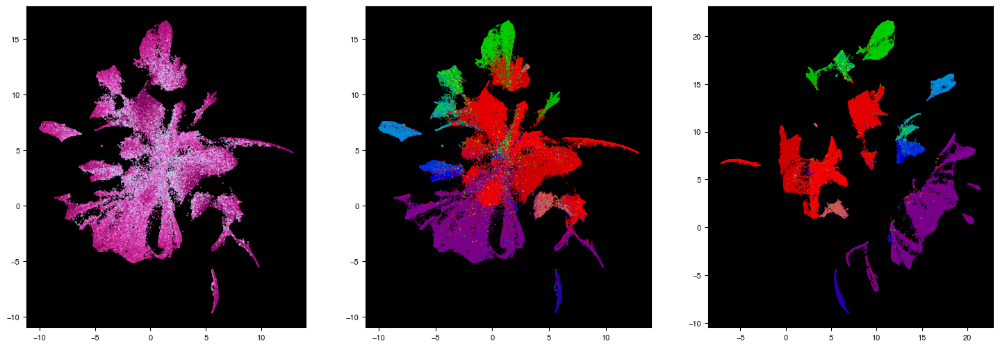

In [71]:
plt.figure(figsize=(18,6))

ax_global = plt.subplot(131,facecolor='k')
ax_global.scatter(embedding_global[:,0],embedding_global[:,1],c=adata.obs['mean_integrity'],cmap=_BIH_CMAP,s=0.1,rasterized=True)
ax_global.set_aspect('equal')

ax_celltypes = plt.subplot(132,facecolor='k')
ax_celltypes.scatter(embedding_global[:,0],embedding_global[:,1],c=mapmycells_df_top.class_name.astype('category').cat.codes,cmap='nipy_spectral',s=0.1,vmin=-2,vmax=34,rasterized=True)

ax_cleaned = plt.subplot(133,facecolor='k')
ax_cleaned.scatter(embedding_cleaned[:,0],embedding_cleaned[:,1],c=mapmycells_df_top.class_name.astype('category').cat.codes[adata.obs['mean_integrity']>0.7],cmap='nipy_spectral',vmin=-2,vmax=34,s=0.1,rasterized=True)


In [73]:
adata

AnnData object with n_obs × n_vars = 162033 × 541
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'mean_integrity', 'min_integrity', 'median_integrity', 'quartile_integrity', 'above_threshold', 'area', 'integrity', 'nucleus_x', 'nucleus_y', 'nuclear_integrity', 'assignments_by_marker_counts', 'marker_purities'
    var: 'gene_id', 'feature_type'